## **Thank You For Applying to work at TRAM Global**.  

Please name your notebook lastname_firstname_tram_assignment.ipynb

For example if your name is John Smith, your notebook should be titled Smith_John_tram_assignment.ipynb

The dataset that you will be using is linked in the cell below

**Please complete Part 1 and Part 5**

**Complete two out of Part 2, Part 3, and Part 4**

Note: For the machine learning sections of the assignment feel free to use any library to implement the models




In [215]:
import warnings
warnings.filterwarnings("ignore")

In [216]:
import os
os.environ['KAGGLE_CONFIG_DIR']='/content'

In [217]:
#install kaggle api key and download this data linked below
!kaggle datasets download -d ramakrishnanthiyagu/delivery-truck-trips-data

  0% 0.00/1.61M [00:00<?, ?B/s]
100% 1.61M/1.61M [00:00<00:00, 148MB/s]


In [218]:
!unzip /content/delivery-truck-trips-data.zip

Archive:  /content/delivery-truck-trips-data.zip
  inflating: Delivery truck trip data.xlsx  


##Part 1: Data Processing and EDA

1. Load in the downloaded dataset into a DataFrame
2. Ensure all columns have appropriate data types
3. Identify rows with null or invalid value and deal with the rows appropriately
4. Create 2-4 interesting graphs that look at non coordinate attributes of the dataset
5. Create a map that uses coordinates to display the start and end coordinates of every trip

# Loading the dataset

In [219]:
pip install ydata_profiling

In [220]:
import pandas as pd
from ydata_profiling import ProfileReport
import numpy as np
from geopy.distance import geodesic
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer


In [221]:
df=pd.read_excel('/content/Delivery truck trip data.xlsx')
df

,GpsProvider,BookingID,Market/Regular,BookingID_Date,vehicle_no,Origin_Location,Destination_Location,Org_lat_lon,Des_lat_lon,Data_Ping_time,...,TRANSPORTATION_DISTANCE_IN_KM,vehicleType,Minimum_kms_to_be_covered_in_a_day,Driver_Name,Driver_MobileNo,customerID,customerNameCode,supplierID,supplierNameCode,Material Shipped
0,CONSENT TRACK,MVCV0000927/082021,Market,2020-08-17 14:59:01.000,KA590408,"TVSLSL-PUZHAL-HUB,CHENNAI,TAMIL NADU","ASHOK LEYLAND PLANT 1- HOSUR,HOSUR,KARNATAKA","13.1550,80.1960","12.7400,77.8200",2020-08-24 00:05:09,...,320.0,NaN,NaN,NaN,NaN,ALLEXCHE45,Ashok leyland limited,VIJEXHOSR7,VIJAY TRANSPORT,BRACKET / GRAB HANDLE
1,VAMOSYS,VCV00014271/082021,Regular,2020-08-27 16:22:22.827,TN30BC5917,"DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","12.8390,79.9540","12.8390,79.9540",2020-08-28 12:40:28,...,103.0,NaN,NaN,RAMESH,NaN,DMREXCHEUX,Daimler india commercial vehicles pvt lt,VJLEXSHE09,VJ LOGISTICS,ZB MODEL PLATE / 3143
2,CONSENT TRACK,VCV00014382/082021,Regular,2020-08-27 17:59:24.987,TN22AR2748,"LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","11.8710,79.7390","11.8710,79.7390",2020-08-28 09:05:09,...,300.0,NaN,NaN,GIRI,NaN,LUTGCCHE06,Lucas tvs ltd,GSTEXLAK1Q,G.S. TRANSPORT,LETTERING / FUSO
3,VAMOSYS,VCV00014743/082021,Regular,2020-08-28 00:48:24.503,TN28AQ0781,"DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","12.8390,79.9540","12.8390,79.9540",2020-08-28 12:40:31,...,61.0,NaN,NaN,RAVI,NaN,DMREXCHEUX,Daimler india commercial vehicles pvt lt,ARVEXNAM09,ARVINTH TRANSPORT,LU STRUT RA / RADIUS ROD
4,VAMOSYS,VCV00014744/082021,Regular,2020-08-28 01:23:19.243,TN68F1722,"LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","11.8720,79.6320","11.8720,79.6320",2020-08-28 12:40:29,...,240.0,NaN,NaN,TAMIL,NaN,LUTGCCHE06,Lucas tvs ltd,SRTEXKOR96,SR TRANSPORTS,WISHBONE / V ROD/HDT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6875,JTECH,WDSBKTP42751,Regular,2019-03-27 17:25:33.000,KA219502,"Ramamurthy Nagar, Bangalore, Karnataka","Sahakaranagar P.O, Bangalore, Karnataka","13.007503209603689,77.665098855934886","13.068901840235711,77.590655738806618",2019-06-14 15:20:12,...,12.0,25 FT Open Body 21MT,NaN,NaN,NaN,LTLEXMUM40,Larsen & toubro limited,55556,A S TRANSPORTS,TOOL KIT SET
6876,JTECH,WDSBKTP43203,Regular,2019-03-31 15:02:34.000,KA01AE9163,"Ramamurthy Nagar, Bangalore, Karnataka","Bangalore International Airport, Bangalore, Ka...","13.007503209603689,77.665098855934886","13.196312912801169,77.708156925688726",2019-06-14 15:20:12,...,31.0,40 FT 3XL Trailer 35MT,NaN,NaN,NaN,LTLEXMUM40,Larsen & toubro limited,55556,A S TRANSPORTS,CONTROL LEVER ASSY
6877,JTECH,WDSBKTP43021,Regular,2019-03-29 18:56:26.000,KA01AE9163,"Mugabala, Bangalore Rural, Karnataka","Anekal, Bangalore, Karnataka","16.560192249175344,80.792293091599547","12.722686,77.676518",2019-06-14 15:20:12,...,49.0,40 FT 3XL Trailer 35MT,NaN,NaN,NaN,LTLEXMUM40,Larsen & toubro limited,55556,A S TRANSPORTS,SPARE PARTS AUTOMOBILE
6878,JTECH,WDSBKTP42685,Regular,2019-03-27 08:29:45.000,KA21A3643,"Mugabala, Bangalore Rural, Karnataka","Anekal, Bangalore, Karnataka","16.560192249175344,80.792293091599547","12.896896847817695,77.712223056874862",2019-06-14 15:20:12,...,49.0,40 FT 3XL Trailer 35MT,NaN,NaN,NaN,LTLEXMUM40,Larsen & toubro limited,55556,A S TRANSPORTS,SPARE PARTS AUTOMOBILE


In [222]:
profile = ProfileReport(df,title="Profile Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Ensuring all columns have appropriate data types

In [223]:
print(df.dtypes)

GpsProvider                                   object
BookingID                                     object
Market/Regular                                object
BookingID_Date                        datetime64[ns]
vehicle_no                                    object
Origin_Location                               object
Destination_Location                          object
Org_lat_lon                                   object
Des_lat_lon                                   object
Data_Ping_time                        datetime64[ns]
Planned_ETA                           datetime64[ns]
Current_Location                              object
DestinationLocation                           object
actual_eta                            datetime64[ns]
Curr_lat                                     float64
Curr_lon                                     float64
ontime                                        object
delay                                         object
OriginLocation_Code                           

Org_lat_lon      
Des_lat_lon  
This Columns are in String we can seperate them as latitude and longitude column using comma                                  

#Checking Null and Invalid Values

In [224]:
df.isnull().sum()

GpsProvider                            953
BookingID                                0
Market/Regular                           0
BookingID_Date                           0
vehicle_no                               0
Origin_Location                          0
Destination_Location                     0
Org_lat_lon                              0
Des_lat_lon                              0
Data_Ping_time                         953
Planned_ETA                              0
Current_Location                       964
DestinationLocation                      0
actual_eta                              37
Curr_lat                               953
Curr_lon                               953
ontime                                4332
delay                                 2538
OriginLocation_Code                      3
DestinationLocation_Code                27
trip_start_date                          0
trip_end_date                          194
TRANSPORTATION_DISTANCE_IN_KM          712
vehicleType

In [225]:
invalid_Planned_ETA = df[~pd.to_datetime(df['Planned_ETA'], errors='coerce').notna()]

print(invalid_Planned_ETA)

Empty DataFrame
Columns: [GpsProvider, BookingID, Market/Regular , BookingID_Date, vehicle_no, Origin_Location, Destination_Location, Org_lat_lon, Des_lat_lon, Data_Ping_time, Planned_ETA, Current_Location, DestinationLocation, actual_eta, Curr_lat, Curr_lon, ontime, delay, OriginLocation_Code, DestinationLocation_Code, trip_start_date, trip_end_date, TRANSPORTATION_DISTANCE_IN_KM, vehicleType, Minimum_kms_to_be_covered_in_a_day, Driver_Name, Driver_MobileNo, customerID, customerNameCode, supplierID, supplierNameCode, Material Shipped]
Index: []

[0 rows x 32 columns]


In [226]:
invalid_trip_start_date = df[~pd.to_datetime(df['trip_start_date'], errors='coerce').notna()]

print(invalid_trip_start_date)

Empty DataFrame
Columns: [GpsProvider, BookingID, Market/Regular , BookingID_Date, vehicle_no, Origin_Location, Destination_Location, Org_lat_lon, Des_lat_lon, Data_Ping_time, Planned_ETA, Current_Location, DestinationLocation, actual_eta, Curr_lat, Curr_lon, ontime, delay, OriginLocation_Code, DestinationLocation_Code, trip_start_date, trip_end_date, TRANSPORTATION_DISTANCE_IN_KM, vehicleType, Minimum_kms_to_be_covered_in_a_day, Driver_Name, Driver_MobileNo, customerID, customerNameCode, supplierID, supplierNameCode, Material Shipped]
Index: []

[0 rows x 32 columns]


In [227]:
invalid_trip_end_date = df[~pd.to_datetime(df['trip_end_date'], errors='coerce').notna()]

invalid_trip_end_date

,GpsProvider,BookingID,Market/Regular,BookingID_Date,vehicle_no,Origin_Location,Destination_Location,Org_lat_lon,Des_lat_lon,Data_Ping_time,...,TRANSPORTATION_DISTANCE_IN_KM,vehicleType,Minimum_kms_to_be_covered_in_a_day,Driver_Name,Driver_MobileNo,customerID,customerNameCode,supplierID,supplierNameCode,Material Shipped
0,CONSENT TRACK,MVCV0000927/082021,Market,2020-08-17 14:59:01.000,KA590408,"TVSLSL-PUZHAL-HUB,CHENNAI,TAMIL NADU","ASHOK LEYLAND PLANT 1- HOSUR,HOSUR,KARNATAKA","13.1550,80.1960","12.7400,77.8200",2020-08-24 00:05:09,...,320.0,NaN,NaN,NaN,NaN,ALLEXCHE45,Ashok leyland limited,VIJEXHOSR7,VIJAY TRANSPORT,BRACKET / GRAB HANDLE
1,VAMOSYS,VCV00014271/082021,Regular,2020-08-27 16:22:22.827,TN30BC5917,"DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","12.8390,79.9540","12.8390,79.9540",2020-08-28 12:40:28,...,103.0,NaN,NaN,RAMESH,NaN,DMREXCHEUX,Daimler india commercial vehicles pvt lt,VJLEXSHE09,VJ LOGISTICS,ZB MODEL PLATE / 3143
2,CONSENT TRACK,VCV00014382/082021,Regular,2020-08-27 17:59:24.987,TN22AR2748,"LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","11.8710,79.7390","11.8710,79.7390",2020-08-28 09:05:09,...,300.0,NaN,NaN,GIRI,NaN,LUTGCCHE06,Lucas tvs ltd,GSTEXLAK1Q,G.S. TRANSPORT,LETTERING / FUSO
3,VAMOSYS,VCV00014743/082021,Regular,2020-08-28 00:48:24.503,TN28AQ0781,"DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","12.8390,79.9540","12.8390,79.9540",2020-08-28 12:40:31,...,61.0,NaN,NaN,RAVI,NaN,DMREXCHEUX,Daimler india commercial vehicles pvt lt,ARVEXNAM09,ARVINTH TRANSPORT,LU STRUT RA / RADIUS ROD
4,VAMOSYS,VCV00014744/082021,Regular,2020-08-28 01:23:19.243,TN68F1722,"LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","11.8720,79.6320","11.8720,79.6320",2020-08-28 12:40:29,...,240.0,NaN,NaN,TAMIL,NaN,LUTGCCHE06,Lucas tvs ltd,SRTEXKOR96,SR TRANSPORTS,WISHBONE / V ROD/HDT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1354,CONSENT TRACK,AEIBK2025320,Regular,2020-08-08 15:10:45.000,RJ21GA4810,"Anekal, Bangalore, Karnataka","Jodhpur, Jodhpur, Rajasthan","12.722686,77.676518","26.2389,73.0243",2020-08-14 13:45:10,...,1969.0,19 FT Open 7MT - MCV,NaN,HEMA RAM MEGHWAL,7.726821e+09,OTIEXHOSJM,Otis elevator company (india) ltd,999,Unknown,AUTO PARTS
1355,CONSENT TRACK,AEIBK2025317,Regular,2020-08-08 15:10:44.000,KA01AB4822,"Anekal, Bangalore, Karnataka","Thumkunta, Hyderabad, Telangana","12.722686,77.676518","17.603892,78.629944",2020-08-14 14:25:12,...,667.0,19 FT Open 7MT - MCV,NaN,KHURAM PASHA,9.845249e+09,OTIEXHOSJM,Otis elevator company (india) ltd,999,Unknown,AUTO PARTS
1357,CONSENT TRACK,AEIBK2025120,Regular,2020-08-06 21:25:41.000,KA407289,"Anekal, Bangalore, Karnataka","Vikarabad, Hyderabad, Telangana","12.722686,77.676518","17.336504,77.904813",2020-08-10 19:35:12,...,617.0,19 FT Open 7MT - MCV,NaN,YASEEN SHARIFF,9.449344e+09,OTIEXHOSJM,Otis elevator company (india) ltd,999,Unknown,Empty trays
1363,CONSENT TRACK,AEIBK2025184,Regular,2020-08-07 17:20:10.000,AP39TJ2466,"Anekal, Bangalore, Karnataka","Puttaparthi, Anantapur, Andhra Pradesh","12.722686,77.676518","14.165574,77.807421",2020-08-08 08:15:08,...,189.0,19 FT Open 7MT - MCV,NaN,Viswanath,9.392982e+09,OTIEXHOSJM,Otis elevator company (india) ltd,999,Unknown,GRS STARTER


In [228]:
missing_trip_end_date = df['trip_end_date'].isnull()

#  'trip_end_date' = 'actual_eta' - 'trip_start_date'
df.loc[missing_trip_end_date, 'trip_end_date'] = df.loc[missing_trip_end_date, 'trip_start_date'] + (df.loc[missing_trip_end_date, 'actual_eta'] - df.loc[missing_trip_end_date, 'trip_start_date'])


In [229]:
invalid_trip_end_date = df[~pd.to_datetime(df['trip_end_date'], errors='coerce').notna()]

invalid_trip_end_date

,GpsProvider,BookingID,Market/Regular,BookingID_Date,vehicle_no,Origin_Location,Destination_Location,Org_lat_lon,Des_lat_lon,Data_Ping_time,...,TRANSPORTATION_DISTANCE_IN_KM,vehicleType,Minimum_kms_to_be_covered_in_a_day,Driver_Name,Driver_MobileNo,customerID,customerNameCode,supplierID,supplierNameCode,Material Shipped


Had Null values in the end date imputed it with values calculating the end date with the help of actual eta and start date of the trip

In [230]:
#.  missing 'actual_eta' values
missing_actual_eta = df['actual_eta'].isnull()

# 'trip_end_date'-'trip_start_date' = actual eta
df.loc[missing_actual_eta, 'actual_eta'] = df.loc[missing_actual_eta, 'trip_end_date'] - df.loc[missing_actual_eta, 'trip_start_date']


In [231]:
df.isnull().sum()

GpsProvider                            953
BookingID                                0
Market/Regular                           0
BookingID_Date                           0
vehicle_no                               0
Origin_Location                          0
Destination_Location                     0
Org_lat_lon                              0
Des_lat_lon                              0
Data_Ping_time                         953
Planned_ETA                              0
Current_Location                       964
DestinationLocation                      0
actual_eta                               0
Curr_lat                               953
Curr_lon                               953
ontime                                4332
delay                                 2538
OriginLocation_Code                      3
DestinationLocation_Code                27
trip_start_date                          0
trip_end_date                            0
TRANSPORTATION_DISTANCE_IN_KM          712
vehicleType

In [232]:
invalid_distance = df[pd.to_numeric(df['TRANSPORTATION_DISTANCE_IN_KM'], errors='coerce').isna()]

print("Rows with invalid TRANSPORTATION_DISTANCE_IN_KM values:")
invalid_distance

Rows with invalid TRANSPORTATION_DISTANCE_IN_KM values:


,GpsProvider,BookingID,Market/Regular,BookingID_Date,vehicle_no,Origin_Location,Destination_Location,Org_lat_lon,Des_lat_lon,Data_Ping_time,...,TRANSPORTATION_DISTANCE_IN_KM,vehicleType,Minimum_kms_to_be_covered_in_a_day,Driver_Name,Driver_MobileNo,customerID,customerNameCode,supplierID,supplierNameCode,Material Shipped
2340,CONSENT TRACK,AEIBK2023118,Regular,2020-07-18 13:43:02,TN30BC1659,"Pondur, Kanchipuram, Tamil Nadu","Sanaswadi, Pune, Maharashtra","12.930429,79.931163","18.674382,74.194453",2020-07-21 11:10:10,...,NaN,32 FT Multi-Axle 14MT - HCV,NaN,PALANIKUMAR P,9.944446e+09,DMREXCHEUX,Daimler india commercial vehicles pvt lt,68045,VJ Logistics,WIPER MOTOR LINK
2345,CONSENT TRACK,AEIBK2022783,Regular,2020-07-14 20:39:07,NL01AB7613,"Jagadambigainagar, Tiruvallur, Tamil Nadu","Dundahera, Gurgaon, Haryana","13.087428,80.184717","28.51276,77.07805",2020-07-21 12:15:09,...,NaN,32 FT Multi-Axle MXL 18MT,NaN,NOMAN,7.372909e+09,BILGCCHE02,Brakes india private ltd,64781,SHREE OM TRANSPORT COMPANY,SOL.SWITCH W/O PLUNGER
2357,VAMOSYS,AEIBK2023123,Regular,2020-07-18 14:29:21,TN888993,"Pondur, Kanchipuram, Tamil Nadu","Sanaswadi, Pune, Maharashtra","12.930429,79.931163","18.674382,74.194453",2020-07-21 11:00:27,...,NaN,32 FT Multi-Axle 14MT - HCV,NaN,GOPALAKRISHNAN M,9.384521e+09,DMREXCHEUX,Daimler india commercial vehicles pvt lt,67730,Arvinth Transport,RECTIFIER ASSEMBLY-SA45
2363,CONSENT TRACK,AEIBK2022478,Regular,2020-07-11 10:01:50,PB13BF9754,"Panruti, Kanchipuram, Tamil Nadu","Gurgaon, Gurgaon, Haryana","12.849818,79.913634","28.430086,77.017841",2020-07-15 09:50:08,...,NaN,19 FT Open 7MT - MCV,NaN,Sakil,7.757950e+09,KOVEXTNUD4,Kone elevator india private limited,79893,SRI OM CARGO CHENNAI,SPINDLE ASSY
2364,CONSENT TRACK,AEIBK2022465,Regular,2020-07-10 12:49:48,HR55X4704,"Panruti, Kanchipuram, Tamil Nadu","Raipur Kutchery, Raipur, Chattisgarh","12.849818,79.913634","21.237547,81.630908",2020-07-15 10:00:07,...,NaN,32 FT Multi-Axle 14MT - HCV,NaN,Jafruddin,7.982876e+09,KOVEXTNUD4,Kone elevator india private limited,999,Unknown,EMPTY FOAM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6857,NaN,WDSBKTP48032,Regular,2019-05-25 16:58:39,TN523989,"Kanchipuram, Tamil Nadu, India","Pondicherry, Puducherry, India","12.837284,79.7041744","11.9415915,79.8083133",NaT,...,NaN,22 FT Taurus Open 16MT - HCV,275.0,NaN,NaN,LTLEXMUM40,Larsen & toubro limited,999,Unknown,ZB PISTON
6858,NaN,WDSBKTP48437,Regular,2019-05-30 10:32:43,TN28BA1747,"Sedarapet, India","Kanchipuram, Tamil Nadu, India","12.0001,79.74839949999999","12.837284,79.7041744",NaT,...,NaN,40 FT 3XL Trailer 35MT,NaN,NaN,NaN,LTLEXMUM40,Larsen & toubro limited,1615,AKR Transport,GUDGEON PIN
6859,NaN,WDSBKTP48534,Regular,2019-05-30 18:35:48,TN21AD9442,"Kanchipuram, Tamil Nadu, India","Pondicherry, Puducherry, India","12.837284,79.7041744","11.9415915,79.8083133",NaT,...,NaN,22 FT Taurus Open 16MT - HCV,275.0,NaN,NaN,LTLEXMUM40,Larsen & toubro limited,999,Unknown,ENGINE_ ASSY_MOPED BSVI
6860,NaN,WDSBKTP48560,Regular,2019-05-31 12:26:23,TN99E1029,"Sedarapet, India","Kanchipuram, Tamil Nadu, India","12.0001,79.74839949999999","12.837284,79.7041744",NaT,...,NaN,40 FT 3XL Trailer 35MT,NaN,NaN,NaN,LTLEXMUM40,Larsen & toubro limited,999,Unknown,AUTO PARTS


In [233]:
df['Org_lat'] = df['Org_lat_lon'].apply(lambda x: x.split(',')[0] if ',' in x else x)
df['Org_lon'] = df['Org_lat_lon'].apply(lambda x: x.split(',')[1] if ',' in x else '')

df['Des_lat'] = df['Des_lat_lon'].apply(lambda x: x.split(',')[0] if ',' in x else x)
df['Des_lon'] = df['Des_lat_lon'].apply(lambda x: x.split(',')[1] if ',' in x else '')



In [234]:
# Convert Org_lat and Org_lon to float
df['Org_lat'] = pd.to_numeric(df['Org_lat'], errors='coerce')
df['Org_lon'] = pd.to_numeric(df['Org_lon'], errors='coerce')

# Convert Des_lat and Des_lon to float
df['Des_lat'] = pd.to_numeric(df['Des_lat'], errors='coerce')
df['Des_lon'] = pd.to_numeric(df['Des_lon'], errors='coerce')

splited the 'org_lat_lon' and 'Des_lat_lon' columns using a comma delimiter to extract latitude and longitude coordinates for better data handling

In [235]:
df.isnull().sum()

GpsProvider                            953
BookingID                                0
Market/Regular                           0
BookingID_Date                           0
vehicle_no                               0
Origin_Location                          0
Destination_Location                     0
Org_lat_lon                              0
Des_lat_lon                              0
Data_Ping_time                         953
Planned_ETA                              0
Current_Location                       964
DestinationLocation                      0
actual_eta                               0
Curr_lat                               953
Curr_lon                               953
ontime                                4332
delay                                 2538
OriginLocation_Code                      3
DestinationLocation_Code                27
trip_start_date                          0
trip_end_date                            0
TRANSPORTATION_DISTANCE_IN_KM          712
vehicleType

In [236]:
df

,GpsProvider,BookingID,Market/Regular,BookingID_Date,vehicle_no,Origin_Location,Destination_Location,Org_lat_lon,Des_lat_lon,Data_Ping_time,...,Driver_MobileNo,customerID,customerNameCode,supplierID,supplierNameCode,Material Shipped,Org_lat,Org_lon,Des_lat,Des_lon
0,CONSENT TRACK,MVCV0000927/082021,Market,2020-08-17 14:59:01.000,KA590408,"TVSLSL-PUZHAL-HUB,CHENNAI,TAMIL NADU","ASHOK LEYLAND PLANT 1- HOSUR,HOSUR,KARNATAKA","13.1550,80.1960","12.7400,77.8200",2020-08-24 00:05:09,...,NaN,ALLEXCHE45,Ashok leyland limited,VIJEXHOSR7,VIJAY TRANSPORT,BRACKET / GRAB HANDLE,13.155000,80.196000,12.740000,77.820000
1,VAMOSYS,VCV00014271/082021,Regular,2020-08-27 16:22:22.827,TN30BC5917,"DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","12.8390,79.9540","12.8390,79.9540",2020-08-28 12:40:28,...,NaN,DMREXCHEUX,Daimler india commercial vehicles pvt lt,VJLEXSHE09,VJ LOGISTICS,ZB MODEL PLATE / 3143,12.839000,79.954000,12.839000,79.954000
2,CONSENT TRACK,VCV00014382/082021,Regular,2020-08-27 17:59:24.987,TN22AR2748,"LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","11.8710,79.7390","11.8710,79.7390",2020-08-28 09:05:09,...,NaN,LUTGCCHE06,Lucas tvs ltd,GSTEXLAK1Q,G.S. TRANSPORT,LETTERING / FUSO,11.871000,79.739000,11.871000,79.739000
3,VAMOSYS,VCV00014743/082021,Regular,2020-08-28 00:48:24.503,TN28AQ0781,"DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","12.8390,79.9540","12.8390,79.9540",2020-08-28 12:40:31,...,NaN,DMREXCHEUX,Daimler india commercial vehicles pvt lt,ARVEXNAM09,ARVINTH TRANSPORT,LU STRUT RA / RADIUS ROD,12.839000,79.954000,12.839000,79.954000
4,VAMOSYS,VCV00014744/082021,Regular,2020-08-28 01:23:19.243,TN68F1722,"LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","11.8720,79.6320","11.8720,79.6320",2020-08-28 12:40:29,...,NaN,LUTGCCHE06,Lucas tvs ltd,SRTEXKOR96,SR TRANSPORTS,WISHBONE / V ROD/HDT,11.872000,79.632000,11.872000,79.632000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6875,JTECH,WDSBKTP42751,Regular,2019-03-27 17:25:33.000,KA219502,"Ramamurthy Nagar, Bangalore, Karnataka","Sahakaranagar P.O, Bangalore, Karnataka","13.007503209603689,77.665098855934886","13.068901840235711,77.590655738806618",2019-06-14 15:20:12,...,NaN,LTLEXMUM40,Larsen & toubro limited,55556,A S TRANSPORTS,TOOL KIT SET,13.007503,77.665099,13.068902,77.590656
6876,JTECH,WDSBKTP43203,Regular,2019-03-31 15:02:34.000,KA01AE9163,"Ramamurthy Nagar, Bangalore, Karnataka","Bangalore International Airport, Bangalore, Ka...","13.007503209603689,77.665098855934886","13.196312912801169,77.708156925688726",2019-06-14 15:20:12,...,NaN,LTLEXMUM40,Larsen & toubro limited,55556,A S TRANSPORTS,CONTROL LEVER ASSY,13.007503,77.665099,13.196313,77.708157
6877,JTECH,WDSBKTP43021,Regular,2019-03-29 18:56:26.000,KA01AE9163,"Mugabala, Bangalore Rural, Karnataka","Anekal, Bangalore, Karnataka","16.560192249175344,80.792293091599547","12.722686,77.676518",2019-06-14 15:20:12,...,NaN,LTLEXMUM40,Larsen & toubro limited,55556,A S TRANSPORTS,SPARE PARTS AUTOMOBILE,16.560192,80.792293,12.722686,77.676518
6878,JTECH,WDSBKTP42685,Regular,2019-03-27 08:29:45.000,KA21A3643,"Mugabala, Bangalore Rural, Karnataka","Anekal, Bangalore, Karnataka","16.560192249175344,80.792293091599547","12.896896847817695,77.712223056874862",2019-06-14 15:20:12,...,NaN,LTLEXMUM40,Larsen & toubro limited,55556,A S TRANSPORTS,SPARE PARTS AUTOMOBILE,16.560192,80.792293,12.896897,77.712223


In [237]:
def haversine_distance(org_lat, org_lon, des_lat, des_lon):
    org_coord = (org_lat, org_lon)
    des_coord = (des_lat, des_lon)
    return geodesic(org_coord, des_coord).kilometers

# Calculate 'TRANSPORTATION_DISTANCE_IN_KM' for missing values using lat and lon of org and des
missing_distance_mask = df['TRANSPORTATION_DISTANCE_IN_KM'].isnull()
for index, row in df[missing_distance_mask].iterrows():
    org_lat, org_lon = row['Org_lat'], row['Org_lon']
    des_lat, des_lon = row['Des_lat'], row['Des_lon']
    distance = haversine_distance(org_lat, org_lon, des_lat, des_lon)
    df.at[index, 'TRANSPORTATION_DISTANCE_IN_KM'] = distance

Imputed missing 'TRANSPORTATION_DISTANCE_IN_KM' values using the Haversine formula, calculating distances from latitude and longitude coordinates

In [238]:
df.isnull().sum()

GpsProvider                            953
BookingID                                0
Market/Regular                           0
BookingID_Date                           0
vehicle_no                               0
Origin_Location                          0
Destination_Location                     0
Org_lat_lon                              0
Des_lat_lon                              0
Data_Ping_time                         953
Planned_ETA                              0
Current_Location                       964
DestinationLocation                      0
actual_eta                               0
Curr_lat                               953
Curr_lon                               953
ontime                                4332
delay                                 2538
OriginLocation_Code                      3
DestinationLocation_Code                27
trip_start_date                          0
trip_end_date                            0
TRANSPORTATION_DISTANCE_IN_KM            0
vehicleType

In [239]:
df

,GpsProvider,BookingID,Market/Regular,BookingID_Date,vehicle_no,Origin_Location,Destination_Location,Org_lat_lon,Des_lat_lon,Data_Ping_time,...,Driver_MobileNo,customerID,customerNameCode,supplierID,supplierNameCode,Material Shipped,Org_lat,Org_lon,Des_lat,Des_lon
0,CONSENT TRACK,MVCV0000927/082021,Market,2020-08-17 14:59:01.000,KA590408,"TVSLSL-PUZHAL-HUB,CHENNAI,TAMIL NADU","ASHOK LEYLAND PLANT 1- HOSUR,HOSUR,KARNATAKA","13.1550,80.1960","12.7400,77.8200",2020-08-24 00:05:09,...,NaN,ALLEXCHE45,Ashok leyland limited,VIJEXHOSR7,VIJAY TRANSPORT,BRACKET / GRAB HANDLE,13.155000,80.196000,12.740000,77.820000
1,VAMOSYS,VCV00014271/082021,Regular,2020-08-27 16:22:22.827,TN30BC5917,"DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","12.8390,79.9540","12.8390,79.9540",2020-08-28 12:40:28,...,NaN,DMREXCHEUX,Daimler india commercial vehicles pvt lt,VJLEXSHE09,VJ LOGISTICS,ZB MODEL PLATE / 3143,12.839000,79.954000,12.839000,79.954000
2,CONSENT TRACK,VCV00014382/082021,Regular,2020-08-27 17:59:24.987,TN22AR2748,"LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","11.8710,79.7390","11.8710,79.7390",2020-08-28 09:05:09,...,NaN,LUTGCCHE06,Lucas tvs ltd,GSTEXLAK1Q,G.S. TRANSPORT,LETTERING / FUSO,11.871000,79.739000,11.871000,79.739000
3,VAMOSYS,VCV00014743/082021,Regular,2020-08-28 00:48:24.503,TN28AQ0781,"DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","DAIMLER INDIA COMMERCIAL VEHICLES,KANCHIPURAM,...","12.8390,79.9540","12.8390,79.9540",2020-08-28 12:40:31,...,NaN,DMREXCHEUX,Daimler india commercial vehicles pvt lt,ARVEXNAM09,ARVINTH TRANSPORT,LU STRUT RA / RADIUS ROD,12.839000,79.954000,12.839000,79.954000
4,VAMOSYS,VCV00014744/082021,Regular,2020-08-28 01:23:19.243,TN68F1722,"LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","LUCAS TVS LTD-PONDY,PONDY,PONDICHERRY","11.8720,79.6320","11.8720,79.6320",2020-08-28 12:40:29,...,NaN,LUTGCCHE06,Lucas tvs ltd,SRTEXKOR96,SR TRANSPORTS,WISHBONE / V ROD/HDT,11.872000,79.632000,11.872000,79.632000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6875,JTECH,WDSBKTP42751,Regular,2019-03-27 17:25:33.000,KA219502,"Ramamurthy Nagar, Bangalore, Karnataka","Sahakaranagar P.O, Bangalore, Karnataka","13.007503209603689,77.665098855934886","13.068901840235711,77.590655738806618",2019-06-14 15:20:12,...,NaN,LTLEXMUM40,Larsen & toubro limited,55556,A S TRANSPORTS,TOOL KIT SET,13.007503,77.665099,13.068902,77.590656
6876,JTECH,WDSBKTP43203,Regular,2019-03-31 15:02:34.000,KA01AE9163,"Ramamurthy Nagar, Bangalore, Karnataka","Bangalore International Airport, Bangalore, Ka...","13.007503209603689,77.665098855934886","13.196312912801169,77.708156925688726",2019-06-14 15:20:12,...,NaN,LTLEXMUM40,Larsen & toubro limited,55556,A S TRANSPORTS,CONTROL LEVER ASSY,13.007503,77.665099,13.196313,77.708157
6877,JTECH,WDSBKTP43021,Regular,2019-03-29 18:56:26.000,KA01AE9163,"Mugabala, Bangalore Rural, Karnataka","Anekal, Bangalore, Karnataka","16.560192249175344,80.792293091599547","12.722686,77.676518",2019-06-14 15:20:12,...,NaN,LTLEXMUM40,Larsen & toubro limited,55556,A S TRANSPORTS,SPARE PARTS AUTOMOBILE,16.560192,80.792293,12.722686,77.676518
6878,JTECH,WDSBKTP42685,Regular,2019-03-27 08:29:45.000,KA21A3643,"Mugabala, Bangalore Rural, Karnataka","Anekal, Bangalore, Karnataka","16.560192249175344,80.792293091599547","12.896896847817695,77.712223056874862",2019-06-14 15:20:12,...,NaN,LTLEXMUM40,Larsen & toubro limited,55556,A S TRANSPORTS,SPARE PARTS AUTOMOBILE,16.560192,80.792293,12.896897,77.712223


In [240]:
df['ontime'] = df['ontime'].astype(str)

# 'ontime' column with 'Yes' or 'No' values
df['ontime'] = df.apply(lambda row: 'Yes' if 'g' in row['ontime'].lower() else 'No', axis=1)

# Drop the 'delay' column
df = df.drop('delay', axis=1)


Added 'ontime' as a column with 'Yes' or 'No' values based on 'G' presence and removed the 'delay' column

In [241]:
df.columns.values[2] = 'Type_of_Trip'

In [242]:
df['trip_duration_hours'] = (df['trip_end_date'] - df['trip_start_date']).dt.total_seconds() / 3600

In [243]:
df['Planned_Duration'] = (df['Planned_ETA'] - df['trip_start_date']).dt.total_seconds() / 3600


In [244]:
df = df.drop_duplicates(subset=['Org_lat_lon', 'Des_lat_lon', 'trip_duration_hours'], keep='first')


In [245]:
df = df[df['trip_duration_hours'] > 0]

In [246]:
df = df[df['Org_lat_lon'] != df['Des_lat_lon']]

In [247]:
print(df.dtypes)

GpsProvider                                   object
BookingID                                     object
Type_of_Trip                                  object
BookingID_Date                        datetime64[ns]
vehicle_no                                    object
Origin_Location                               object
Destination_Location                          object
Org_lat_lon                                   object
Des_lat_lon                                   object
Data_Ping_time                        datetime64[ns]
Planned_ETA                           datetime64[ns]
Current_Location                              object
DestinationLocation                           object
actual_eta                                    object
Curr_lat                                     float64
Curr_lon                                     float64
ontime                                        object
OriginLocation_Code                           object
DestinationLocation_Code                      

# Analysis on non coordinate attributes of the dataset

#Trip Type Analysis:

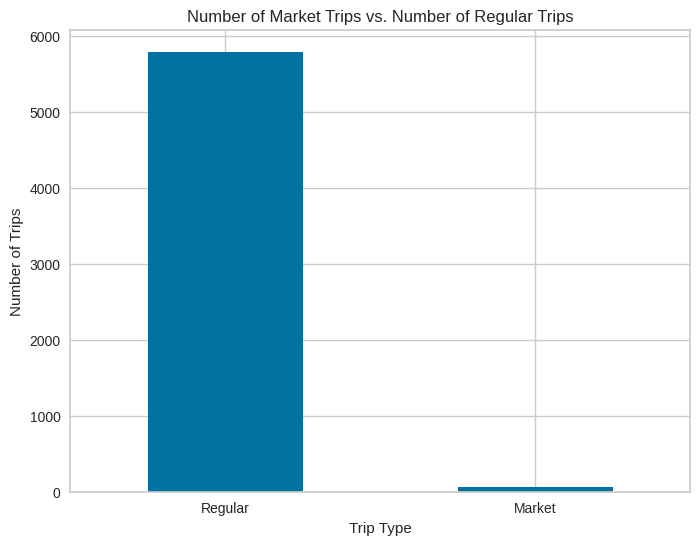

In [248]:
trip_counts = df['Type_of_Trip'].value_counts()

trip_counts.plot(kind='bar', figsize=(8, 6))
plt.title('Number of Market Trips vs. Number of Regular Trips')
plt.xlabel('Trip Type')
plt.ylabel('Number of Trips')
plt.xticks(rotation=0)

plt.show()

In [249]:
market_trips = df[df['Type_of_Trip'] == 'Market']
print(len(market_trips))
print(market_trips['vehicleType'].isna().sum().sum())


56
56


In the dataset, all the values in the "vehicleType" attribute for market deliveries are missing (NaN). This indicates that there is no available information about the types of vehicles used for these specific market trips

#Vehicle Perfomance

In [250]:
filtered_df = df[df['vehicleType'] != 'No Operation']

# Group the data by vehicle type and calculate the sum of distances
vehicle_type_counts = filtered_df['vehicleType'].value_counts()
top_10_vehicle_types = vehicle_type_counts.head(10).index
# selcting 10 vehicle with most trips
filtered_df = filtered_df[filtered_df['vehicleType'].isin(top_10_vehicle_types)]
# Grouping bu vehicle type and distance covered
vehicle_type_distances = filtered_df.groupby('vehicleType')['TRANSPORTATION_DISTANCE_IN_KM'].sum()
# Sorting in descending order
vehicle_type_distances = vehicle_type_distances.sort_values(ascending=False)
fig = px.bar(vehicle_type_distances, x=vehicle_type_distances.index, y=vehicle_type_distances.values,
             title='Top 10 Vehicle Types by Trips and Distance Covered', labels={'x': 'Vehicle Type', 'y': 'Total Distance (km)'})

fig.show()


In [251]:
# count of on-time deliveries for vehicle type
on_time_counts = df[df['ontime'] == 'Yes'].groupby('vehicleType').size()
# sum of distances for vehicle type
vehicle_distances = df.groupby('vehicleType')['TRANSPORTATION_DISTANCE_IN_KM'].sum()
# 10 vehicle with most deleveries
top_10_vehicle_types_on_time = on_time_counts.nlargest(10).index
#include only the top 10 vehicle types
filtered_df = df[df['vehicleType'].isin(top_10_vehicle_types_on_time)]
# Csum of distances covered
vehicle_distances_top_10 = filtered_df.groupby('vehicleType')['TRANSPORTATION_DISTANCE_IN_KM'].sum()
on_time_counts_top_10 = on_time_counts[top_10_vehicle_types_on_time].sort_values(ascending=False)


fig = px.bar(x=on_time_counts_top_10.index, y=on_time_counts_top_10, color=vehicle_distances_top_10,
             labels={'x': 'Vehicle Type', 'y': 'On-Time Deliveries', 'color': 'Total Distance (km)'},
             title='Top 10 Vehicle Types with Most On-Time Deliveries and Total Distances Covered')
fig.show()


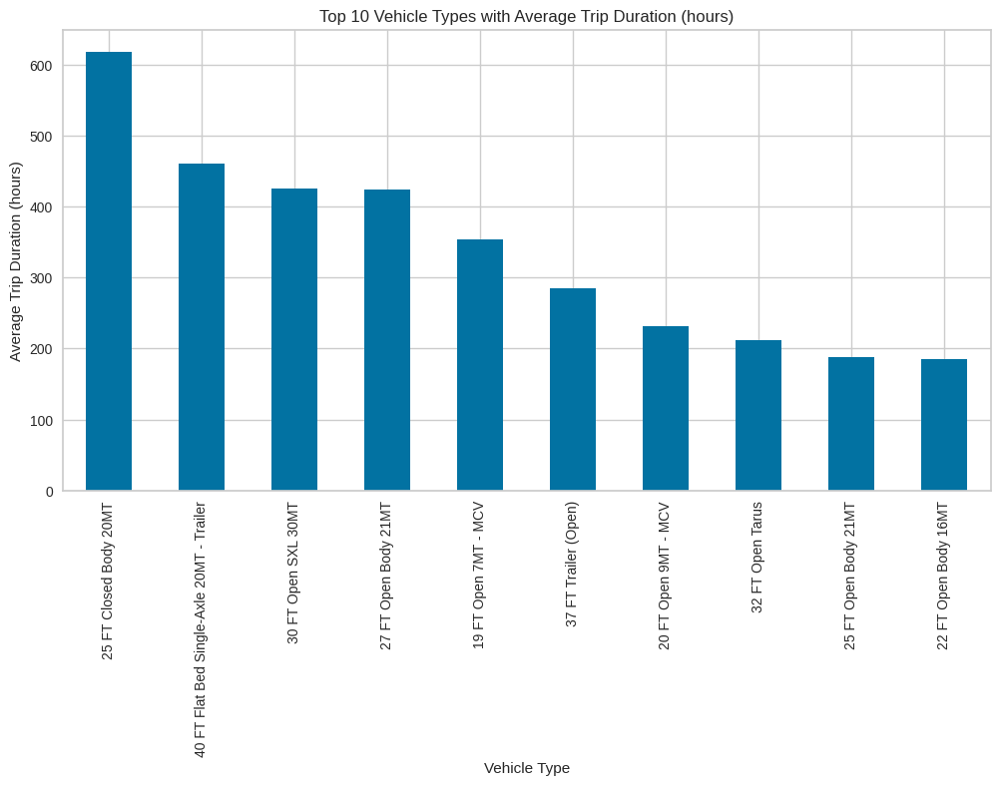

In [252]:
average_durations = df.groupby('vehicleType')['trip_duration_hours'].mean()

#top 10 vehicles
top_10_vehicle_types = average_durations.nlargest(10)

top_10_vehicle_types.plot(kind='bar', figsize=(12, 6))
plt.title('Top 10 Vehicle Types with Average Trip Duration (hours)')
plt.xlabel('Vehicle Type')
plt.ylabel('Average Trip Duration (hours)')

plt.show()

#Trip Duration Analysis:

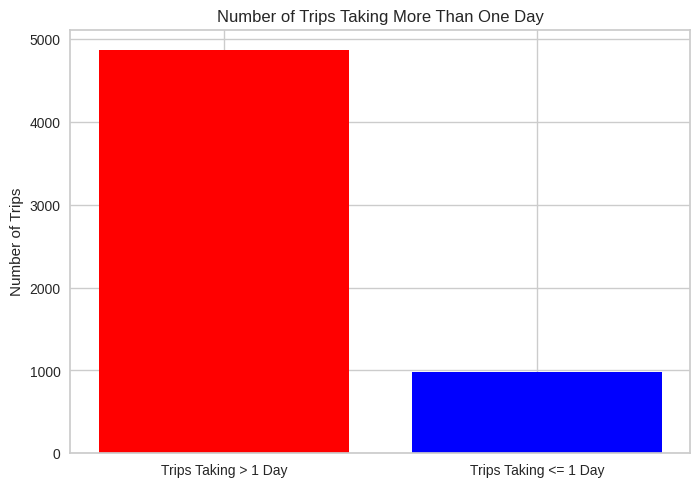

In [253]:
long_trips = df[df['trip_end_date'] - df['trip_start_date'] > pd.Timedelta(days=1)]
num_long_trips = len(long_trips)


plt.bar(['Trips Taking > 1 Day', 'Trips Taking <= 1 Day'], [num_long_trips, len(df) - num_long_trips], color=['red', 'blue'])
plt.title('Number of Trips Taking More Than One Day')
plt.ylabel('Number of Trips')


plt.show()

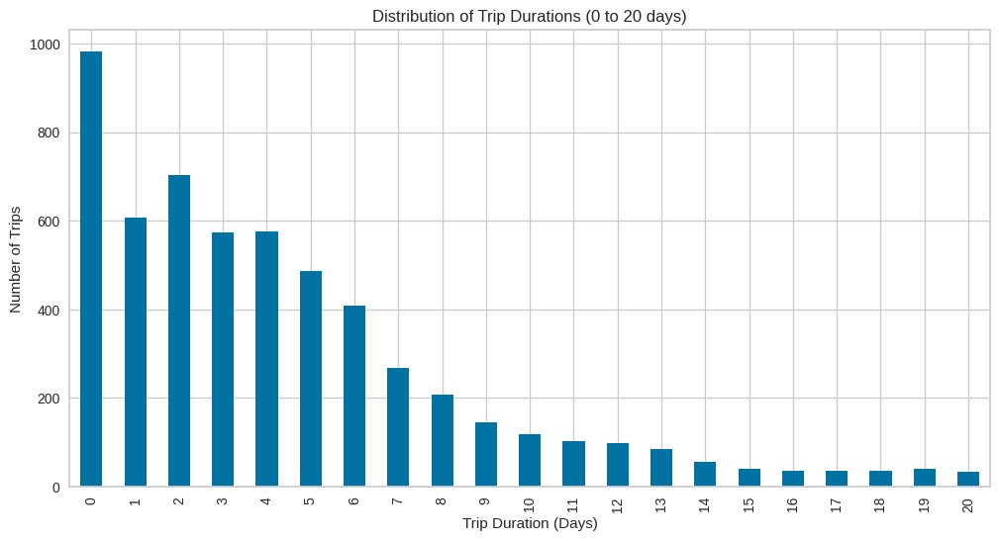

In [254]:
trip_durations = (df['trip_end_date'] - df['trip_start_date']).dt.days

filtered_durations = trip_durations[(trip_durations >= 0) & (trip_durations <= 20)]

trip_duration_counts = filtered_durations.value_counts().sort_index()


trip_duration_counts.plot(kind='bar', figsize=(12, 6))
plt.title('Distribution of Trip Durations (0 to 20 days)')
plt.xlabel('Trip Duration (Days)')
plt.ylabel('Number of Trips')

plt.show()

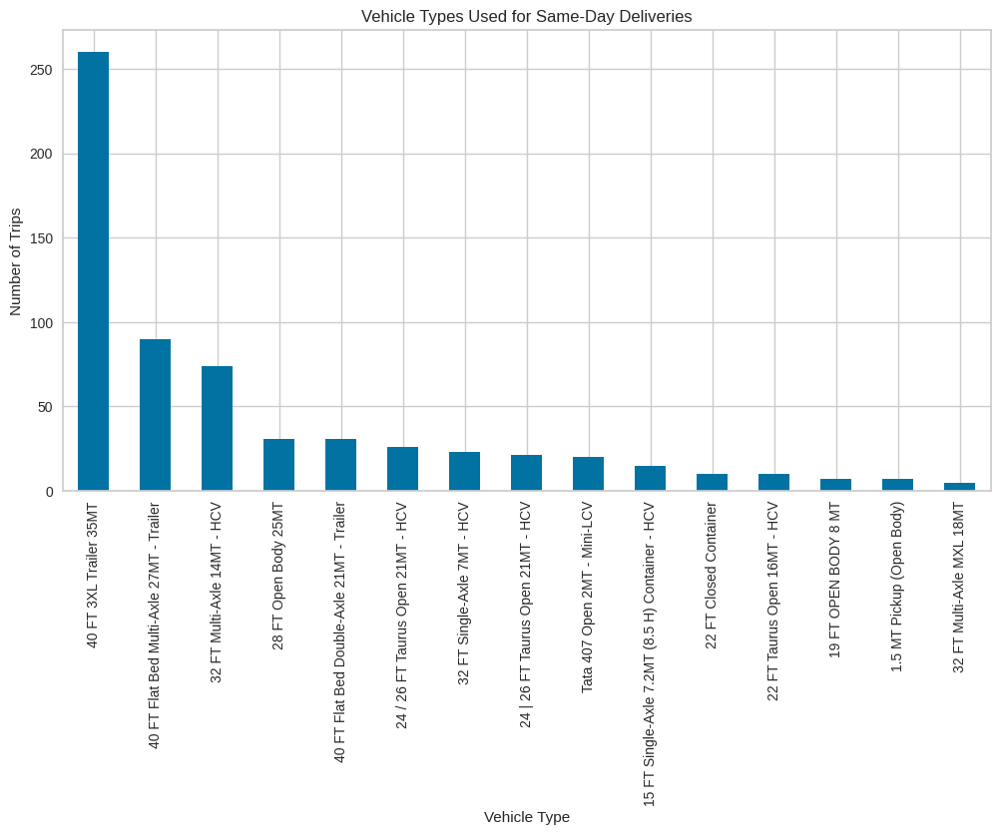

In [255]:
same_day_deliveries = df[(df['trip_end_date'] - df['trip_start_date']).dt.days < 1]

vehicle_type_counts = same_day_deliveries['vehicleType'].value_counts()
top_15_vehicle_types = vehicle_type_counts.head(15)


top_15_vehicle_types.plot(kind='bar', figsize=(12, 6))
plt.title('Vehicle Types Used for Same-Day Deliveries')
plt.xlabel('Vehicle Type')
plt.ylabel('Number of Trips')


plt.show()

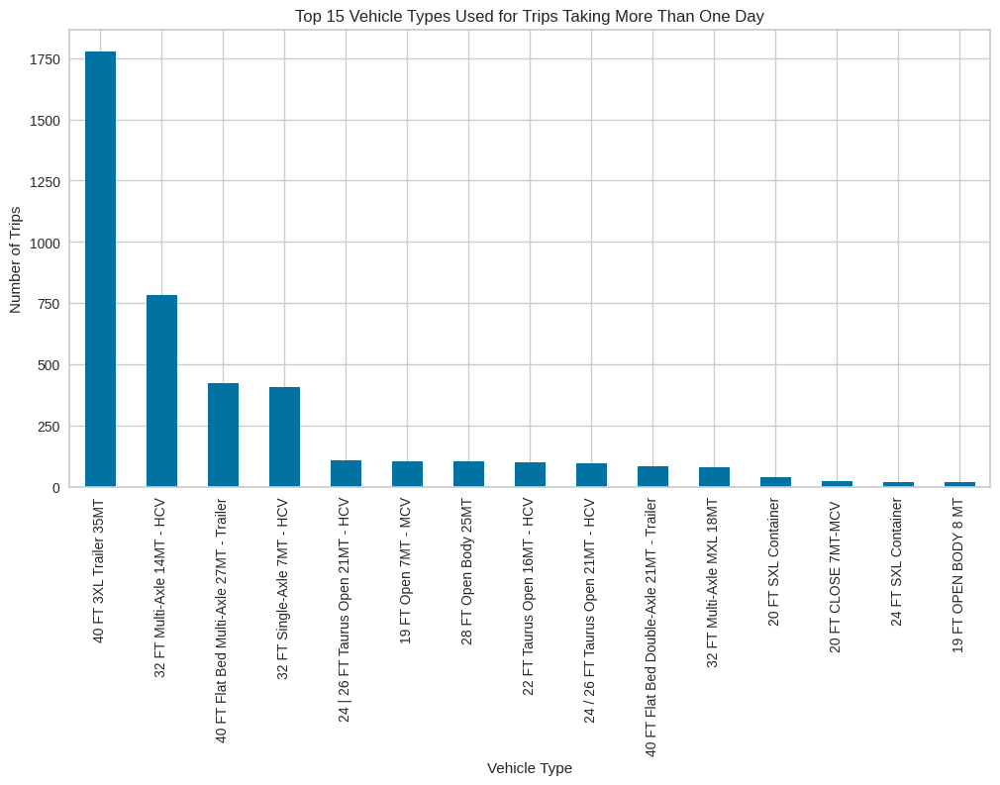

In [256]:
long_deliveries = df[(df['trip_end_date'] - df['trip_start_date']).dt.days > 1]
vehicle_type_counts = long_deliveries['vehicleType'].value_counts()
top_15_vehicle_types = vehicle_type_counts.head(15)


plt.figure(figsize=(12, 6))
top_15_vehicle_types.plot(kind='bar')
plt.title('Top 15 Vehicle Types Used for Trips Taking More Than One Day')
plt.xlabel('Vehicle Type')
plt.ylabel('Number of Trips')


plt.show()

In [257]:
df_2020 = df[(df['trip_start_date'].dt.year == 2020) & (df['Planned_Duration'] > 0)]

# Sort the filtered DataFrame by the trip start date
sorted_df = df_2020.sort_values(by='trip_start_date')

fig = px.line(sorted_df, x='trip_start_date', y=['Planned_Duration', 'trip_duration_hours'],
              labels={'Planned_Duration': 'Planned Duration (hours)', 'trip_duration_hours': 'Trip Duration (hours)'},
              title='Planned Duration vs. Trip Duration in 2020',
              markers=True)
fig.update_xaxes(title='Trip Start Date')
fig.update_yaxes(title='Duration (hours)')

fig.show()

In [258]:
df_2020 = df[(df['trip_start_date'].dt.year == 2020) & (df['Planned_Duration'] > 0) & (df['trip_start_date'] >= '2020-06-01')]
most_common_vehicle_type = df_2020['vehicleType'].value_counts().idxmax()

filtered_df = df_2020[df_2020['vehicleType'] == most_common_vehicle_type]


sorted_df = filtered_df.sort_values(by='trip_start_date')
fig = px.line(sorted_df, x='trip_start_date', y=['Planned_Duration', 'trip_duration_hours'],
              labels={'value': 'Duration (hours)'},
              title=f'{most_common_vehicle_type} - Planned vs. Actual Trip Durations in 2020')


fig.update_layout(xaxis_title='Trip Start Date', yaxis_title='Duration (hours)', legend_title='Data')


fig.show()

This  graph compares planned and actual trip durations for the year 2020, with data points sorted by trip start date. The x-axis represents trip start dates, and the y-axis shows the durations in hours. Two lines depict the planned and actual durations

#Location Analysis

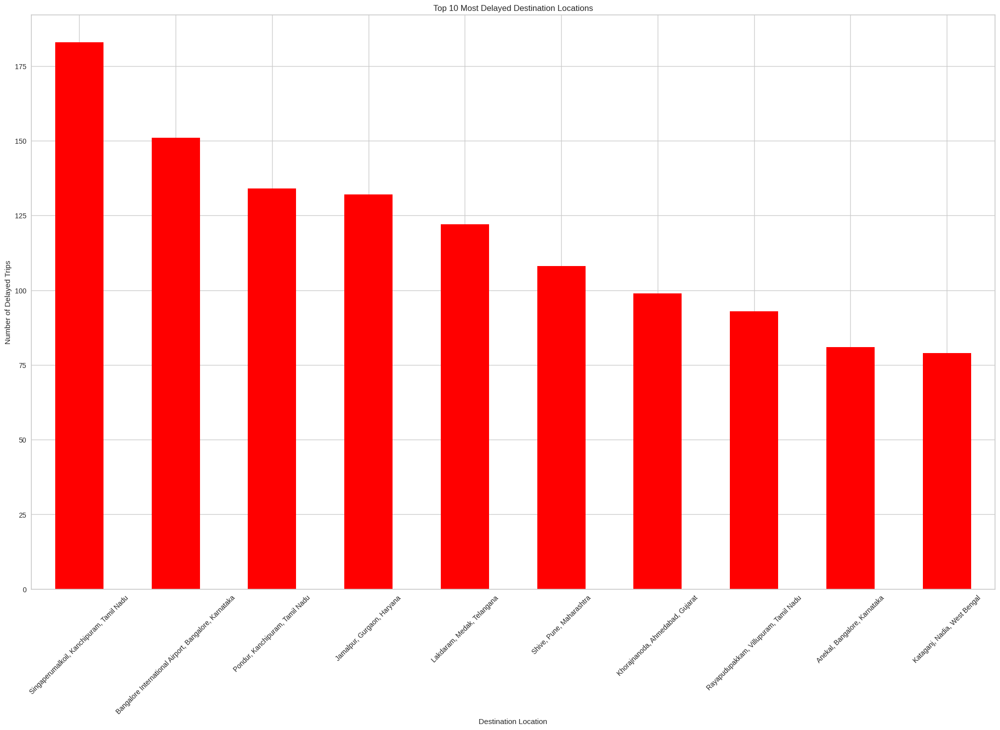

In [259]:
most_delayed_destinations = df[df['ontime'] == 'No']

destination_delay_count = most_delayed_destinations['Destination_Location'].value_counts().head(10)


plt.figure(figsize=(25, 15))
destination_delay_count.plot(kind='bar', color='red')
plt.title('Top 10 Most Delayed Destination Locations')
plt.xlabel('Destination Location')
plt.ylabel('Number of Delayed Trips')
plt.xticks(rotation=45)
plt.show()

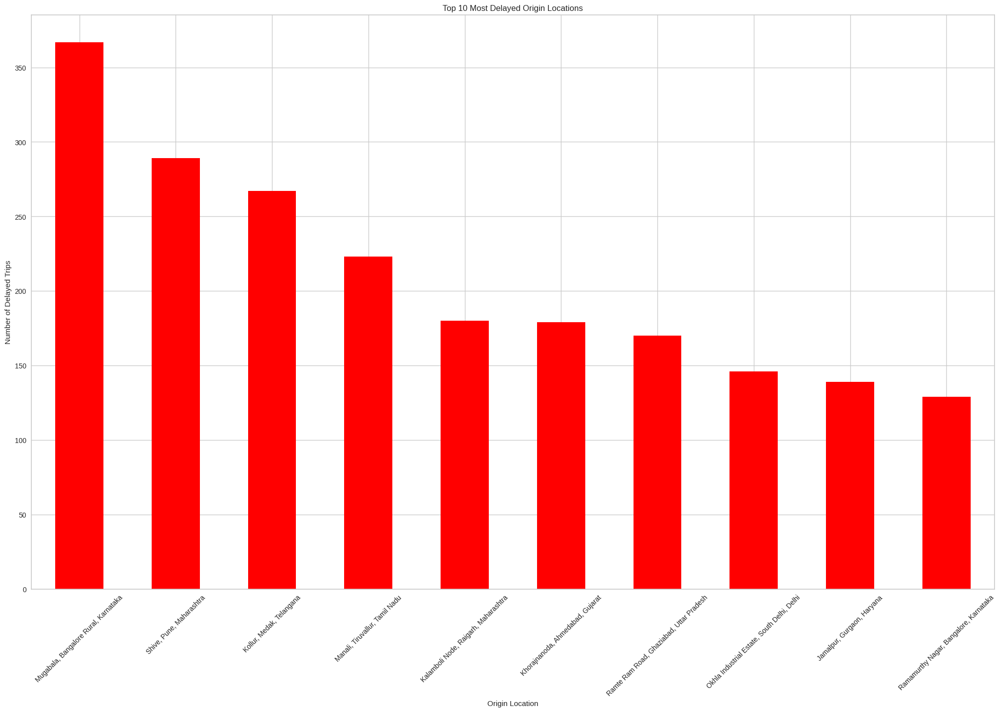

In [260]:
most_delayed_origins = df[df['ontime'] == 'No']
#number of delayed trips
origin_delay_count = most_delayed_origins['Origin_Location'].value_counts().head(10)
plt.figure(figsize=(25, 15))
origin_delay_count.plot(kind='bar', color='red')
plt.title('Top 10 Most Delayed Origin Locations')
plt.xlabel('Origin Location')
plt.ylabel('Number of Delayed Trips')
plt.xticks(rotation=45)
plt.show()

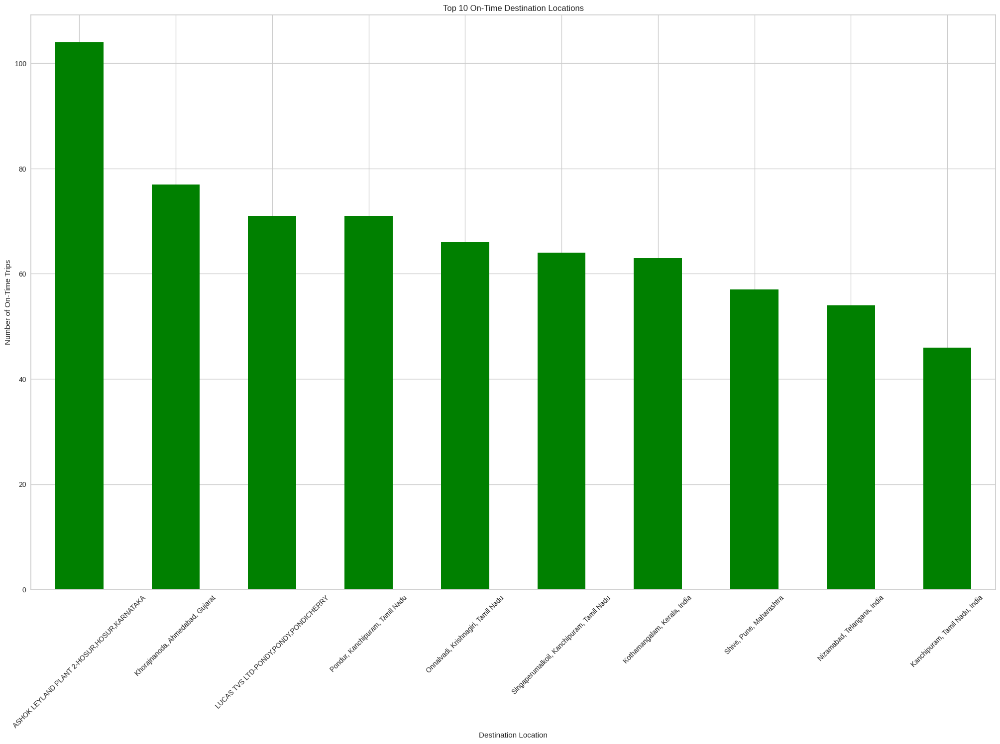

In [261]:
ontime_destinations = df[df['ontime'] == 'Yes']
# Count the number of on-time trips for each destination location
destination_ontime_count = ontime_destinations['Destination_Location'].value_counts().head(10)

plt.figure(figsize=(25, 15))
destination_ontime_count.plot(kind='bar', color='green')
plt.title('Top 10 On-Time Destination Locations')
plt.xlabel('Destination Location')
plt.ylabel('Number of On-Time Trips')
plt.xticks(rotation=45)
plt.show()

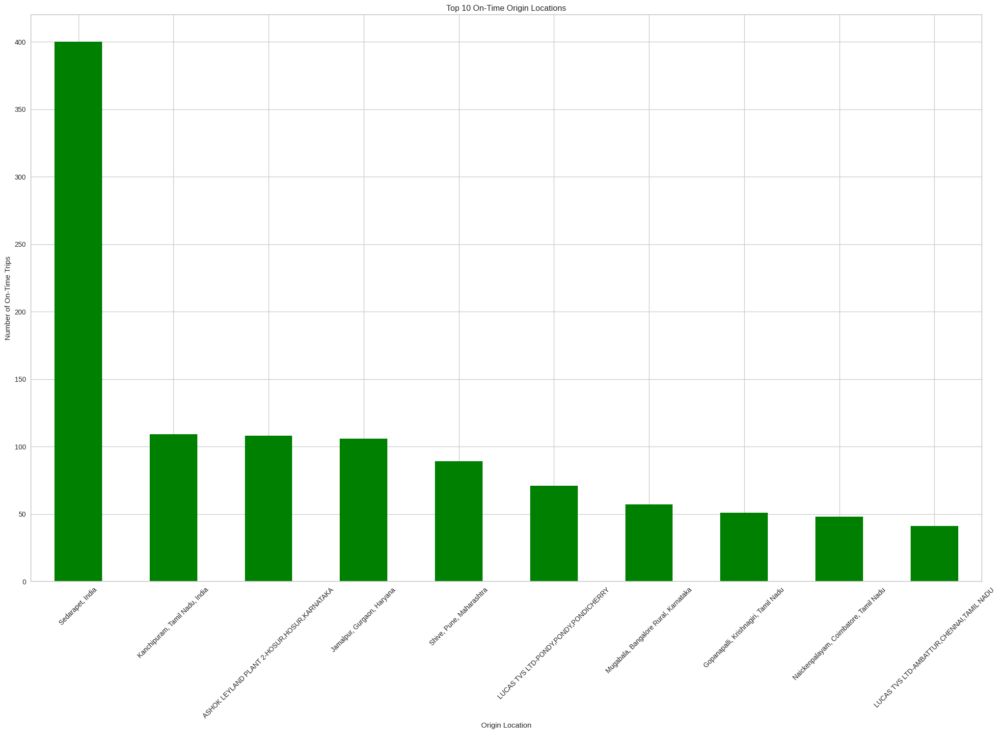

In [262]:
ontime_origins = df[df['ontime'] == 'Yes']

# Count the number of on-time trips for each origin location
origin_ontime_count = ontime_origins['Origin_Location'].value_counts().head(10)
plt.figure(figsize=(25, 15))
origin_ontime_count.plot(kind='bar', color='green')
plt.title('Top 10 On-Time Origin Locations')
plt.xlabel('Origin Location')
plt.ylabel('Number of On-Time Trips')
plt.xticks(rotation=45)
plt.show()

#On time Accuracy

In [263]:
on_time_count = (df['ontime'] == 'Yes').sum()
delayed_count = (df['ontime'] == 'No').sum()


pie_data = pd.DataFrame({
    'Category': ['On Time', 'Delayed'],
    'Count': [on_time_count, delayed_count]
})

fig = px.pie(pie_data, names='Category', values='Count', title='On-Time vs. Delayed Trips')
fig.show()

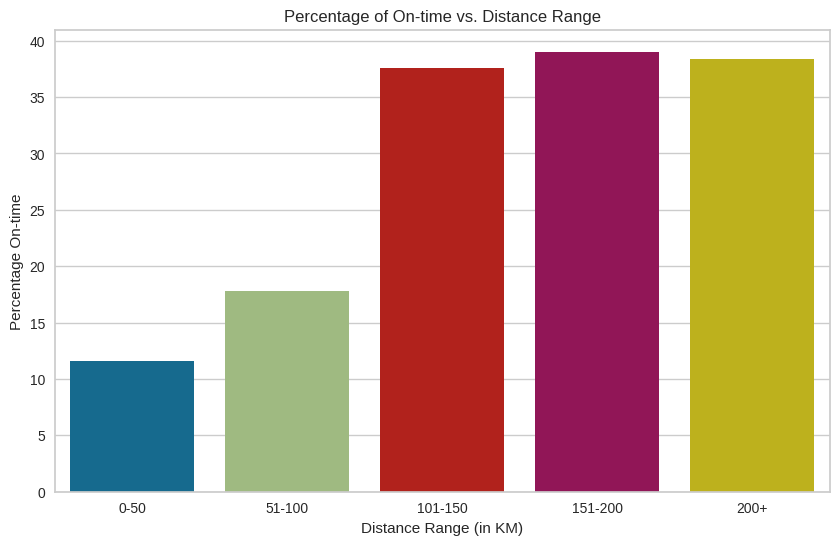

In [264]:
df['Distance Range'] = pd.cut(
    df['TRANSPORTATION_DISTANCE_IN_KM'],
    bins=[0, 50, 100, 150, 200, float('inf')],
    labels=['0-50', '51-100', '101-150', '151-200', '200+']
)

# count of on-time and delayed trips with distance range
distance_counts = df.groupby(['Distance Range', 'ontime'])['BookingID'].count().unstack().fillna(0)

# percentage
distance_counts['Percentage On-time'] = (distance_counts['Yes'] / (distance_counts['Yes'] + distance_counts['No'])) * 100

plt.figure(figsize=(10, 6))
sns.barplot(x='Distance Range', y='Percentage On-time', data=distance_counts.reset_index())
plt.title('Percentage of On-time vs. Distance Range')
plt.xlabel('Distance Range (in KM)')
plt.ylabel('Percentage On-time')
plt.show()

#Supplier Performance:

In [265]:
supplier_counts = df['supplierNameCode'].value_counts()

# top 10 suppliers
top_10_suppliers = supplier_counts.head(10).index

# on-time rate
on_time_rates = []
for supplier in top_10_suppliers:
    supplier_df = df[df['supplierNameCode'] == supplier]
    on_time_count = (supplier_df['ontime'] == 'Yes').sum()
    total_count = len(supplier_df)
    on_time_rate = on_time_count / total_count
    on_time_rates.append(on_time_rate)

supplier_on_time_data = pd.DataFrame({
    'Supplier': top_10_suppliers,
    'On-Time Rate': on_time_rates
})
supplier_on_time_data = supplier_on_time_data.sort_values(by='On-Time Rate', ascending=False)

fig = px.bar(supplier_on_time_data, x='On-Time Rate', y='Supplier', title='On-Time Rate by Supplier (Top 10 Suppliers)')
fig.update_traces(marker_color='skyblue')
fig.update_layout(xaxis_title='On-Time Rate')
fig.show()

In [266]:
supplier_ontime_rate = df.groupby('supplierNameCode')['ontime'].apply(lambda x: (x == 'Yes').mean()).reset_index()
supplier_trip_count = df['supplierNameCode'].value_counts().reset_index()


supplier_ontime_rate.rename(columns={'ontime': 'On-Time Rate'}, inplace=True)
supplier_trip_count.columns = ['supplierNameCode', 'Total Trips']


supplier_performance = supplier_ontime_rate.merge(supplier_trip_count, on='supplierNameCode')


fig = px.scatter(supplier_performance, x='On-Time Rate', y='Total Trips', size='Total Trips', color='On-Time Rate',
                 hover_name='supplierNameCode', title='Supplier On-Time Rate vs. Total Trips')
fig.update_layout(xaxis_title='On-Time Rate', yaxis_title='Total Trips')
fig.show()

In this bubble chart, supplier performance is depicted by combining their on-time rate and the total number of trips they handle. Each bubble represents a supplier, with bubble size indicating trip volume and color denoting on-time performance

In [267]:
on_time_counts = df[df['ontime'] == 'Yes']['vehicleType'].value_counts()

#most on-time deliveries
top_10_vehicle_types = on_time_counts.nlargest(10).index

vehicle_type_on_time_data = pd.DataFrame({
    'Vehicle Type': top_10_vehicle_types,
    'On-Time Deliveries': on_time_counts[top_10_vehicle_types]
})

vehicle_type_on_time_data = vehicle_type_on_time_data.sort_values(by='On-Time Deliveries', ascending=False)

fig = px.bar(vehicle_type_on_time_data, x='On-Time Deliveries', y='Vehicle Type',
             title='Top 10 Vehicle Types with Most On-Time Deliveries',
             labels={'On-Time Deliveries': 'On-Time Deliveries', 'Vehicle Type': 'Vehicle Type'})
fig.update_traces(marker_color='lightgreen')
fig.update_layout(xaxis_title='On-Time Deliveries')
fig.show()


In [268]:
pip install gmplot

In [269]:
pip install geopandas matplotlib


In [270]:
start_trace = px.scatter_mapbox(df,
                                lat="Org_lat", lon="Org_lon", text="Origin_Location",
                                hover_name="Origin_Location", hover_data=["Destination_Location"],
                                zoom=5, height=500, color_discrete_sequence=["blue"])

# Create a separate scatter mapbox plot for end coordinates (color: red)
end_trace = px.scatter_mapbox(df, lat="Des_lat", lon="Des_lon", text="Destination_Location",
                              hover_name="Destination_Location", color_discrete_sequence=["red"])

for trace in end_trace.data:
    start_trace.add_trace(trace)

start_trace.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": 20, "lon": 78},
    mapbox_zoom=4,
    title="Start and End Coordinates of Trips"
)

start_trace.show()

In [271]:
most_delayed_destinations = df[df['ontime'] == 'No']

fig = px.density_mapbox(
    most_delayed_destinations,
    lat="Des_lat",
    lon="Des_lon",
    radius=10,
    zoom=5,
    height=500,
)

fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": 20, "lon": 78},
    mapbox_zoom=4,
    title="Regions with the Most Delayed Deliveries",
)

fig.show()

In [272]:
most_delayed_origins = df[df['ontime'] == 'No']


fig = px.density_mapbox(
    most_delayed_origins,
    lat="Org_lat",
    lon="Org_lon",
    radius=10,
    zoom=5,
    height=500,
)


fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": 20, "lon": 78},
    mapbox_zoom=4,
    title="Regions with the Most Delayed Deliveries (Origin Locations)",
)


fig.show()

## Part 2: Linear Regression

1. Use a linear regression model to predict length of trip from distance of the trip
2. Visualize and explain the results of the model as well

In [273]:
X = df[['TRANSPORTATION_DISTANCE_IN_KM']]
y = df['trip_duration_hours']

In [274]:
#Spilitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [275]:
#Creating the model
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [276]:
y_pred = model.predict(X_test)


In [277]:
#Evaluating the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)


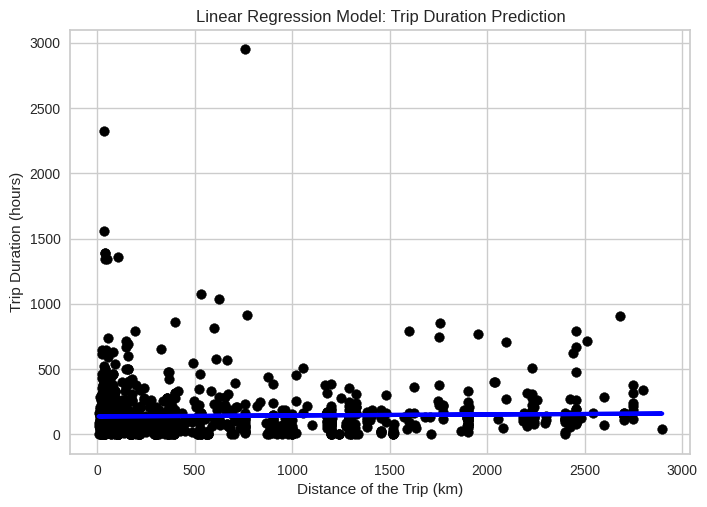

In [278]:
#Creating a Scatter plot
plt.scatter(X_test, y_test, color='black')
plt.plot(X_test, y_pred, color='blue', linewidth=3)
plt.title('Linear Regression Model: Trip Duration Prediction')
plt.xlabel('Distance of the Trip (km)')
plt.ylabel('Trip Duration (hours)')
plt.show()


The graph compares actual trip data points (in black) with the linear regression line (in blue) showing predicted values. Unfortunately, the model falls short of closely matching the points, indicating limitations in predicting trip durations based on distance

In [279]:
#Evaluation Metrics
print(f'Coefficients: {model.coef_}')
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')


Coefficients: [0.00746787]
Mean Squared Error: 39168.7095041806
R-squared: 0.0018485167175557038


- The small coefficient suggests that the impact of distance on trip duration is minimal
- The high Mean Squared Error indicates a notable disparity between our predictions and the actual trip durations, signifying the model's  inaccuracy
- the extremely low R-squared value highlights that the model explains only a tiny fraction of the variation in trip duration, indicating that distance alone is insufficient for predicting this outcome accurately

## Part 3: Binary Classification
1. Create a model that will predict whether a trip will be on time or delayed.
  - You can use any features or model to accomplish this
2. Visualize and explain the results of the model
3. In a markdown cell, explain how the model could be improved

In [280]:
#Dealing with nan values of vehicle type as it is an important attribute
df['vehicleType'] = df['vehicleType'].fillna('unknown')

In [281]:
#Selecting the important futures
selected_features = ['Org_lat', 'Org_lon', 'Des_lat', 'Des_lon',
                      'TRANSPORTATION_DISTANCE_IN_KM', 'vehicleType',
                      'supplierNameCode', 'ontime']

data = df[selected_features]

In [282]:
df['ontime'] = df['ontime'].map({'No': 0, 'Yes': 1})

In [283]:
#Cheking for null values
na_counts = data.isna().sum()

# Display the counts
print(na_counts)

Org_lat                          0
Org_lon                          0
Des_lat                          0
Des_lon                          0
TRANSPORTATION_DISTANCE_IN_KM    0
vehicleType                      0
supplierNameCode                 0
ontime                           0
dtype: int64


In [284]:
# Encode categorical variables using one-hot encoding
data = pd.get_dummies(data, columns=['vehicleType', 'supplierNameCode'])

In [285]:
#Splitting the data
X = data.drop('ontime', axis=1)
y = data['ontime']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [286]:
#Intializing model
Class_model = RandomForestClassifier(random_state=42)

In [287]:
#Training the model
Class_model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [288]:
y_pred = Class_model.predict(X_test)


In [289]:
#Evaluation
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

In [290]:
print(f"Accuracy: {accuracy}")
print("\nClassification Report:")
print(class_report)

Accuracy: 0.8736122971818958

Classification Report:
              precision    recall  f1-score   support

          No       0.89      0.93      0.91       814
         Yes       0.83      0.73      0.78       357

    accuracy                           0.87      1171
   macro avg       0.86      0.83      0.85      1171
weighted avg       0.87      0.87      0.87      1171



- In the analysis of our classification model, we achieved an overall accuracy of 87.28%, indicating that the model successfully predicted whether a trip would be on time or delayed in the majority of cases
- classification report emphasizes that the model exhibits a balance between precision and recall for both classes.

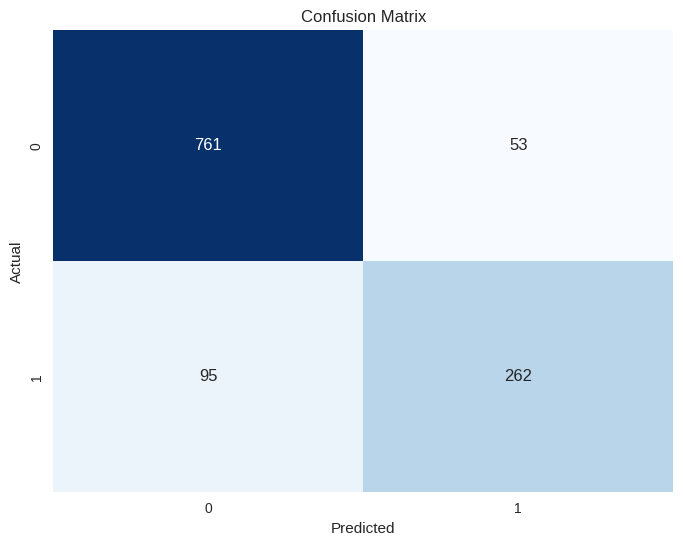

In [291]:
#Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


The confusion matrix revealed 262 true positives, where the model accurately predicted on-time trips, and 761 true negatives, representing correctly predicted delayed trips. However, we also encountered 53 false positives and 95 false negatives, indicating instances where our model misclassified trips

In [292]:
y_probs = Class_model.predict_proba(X_test)[:, 1]


In [293]:
auc_score = roc_auc_score(y_test, y_probs)
print(f'AUC Score: {auc_score}')

AUC Score: 0.9295487236663708


- A high AUC score, such as 92.95%, indicates that the model has a strong discriminatory power The model is effective at distinguishing between the two classes on-time and delayed trips
- The closer the AUC is to 1, the better the model's performance

In [294]:
ytest_binary = [1 if value == 'Yes' else 0 for value in y_test]

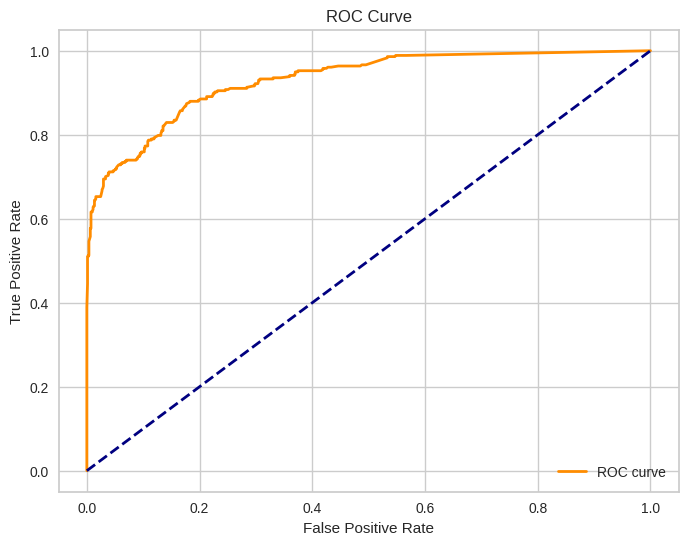

In [295]:
# Calculate ROC curve
fpr, tpr, _ = roc_curve(ytest_binary, y_probs)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()


The ROC curve visually represents the trade-off between the model's ability to correctly identify positive instances (True Positives) and its tendency to misclassify negative instances (False Positives) across different probability thresholds. The curve plots the True Positive Rate (Sensitivity) against the False Positive Rate (1-Specificity). In our case, we achieved an impressive Area Under the Curve (AUC) score of 92.95%, indicating a high level of effectiveness in distinguishing between on-time and delayed trips. The closer the AUC is to 1, the better the model's performance. This means our model excels in correctly ranking instances.

Enhancing performance involves making our model better at its job — predicting outcomes. Accuracy is a key metric that measures how often the model gets its predictions right. The goal is to increase this accuracy by refining the model's strategies.
We can consider following :
- Optimizing the hyperparameters of our model, such as those governing the tree depth in decision trees or the number of estimators in ensemble methods, may further refine its predictive capabilities.
- Applying cross-validation techniques during model training and evaluation can provide a more robust understanding of its generalization performance across different subsets of the data.
- Experimenting with ensemble methods like bagging or boosting, which combine predictions from multiple models, could potentially enhance predictive accuracy.
- Depending on the specific context of the application, fine-tuning the classification threshold might be beneficial. This adjustment can be pivotal, especially when one type of prediction error is more consequential than the other

## Part 4: Clustering

1. Use K-Means Clustering to split different truck drivers into different groups
  - You can use whatever attributes you choose
  - Determine the optimal number of groups to break drivers into
2. Explain some differences between the groups and how this information could be used to make company decisions

In [296]:
#Selecting Attributes
selected_attributes = ['trip_duration_hours', 'TRANSPORTATION_DISTANCE_IN_KM']
cluster_data = df[selected_attributes]

In [297]:
scaler = StandardScaler()
cluster_data_scaled = scaler.fit_transform(cluster_data)


Standardizing the data is done to ensure that all features contribute equally to clustering algorithms,

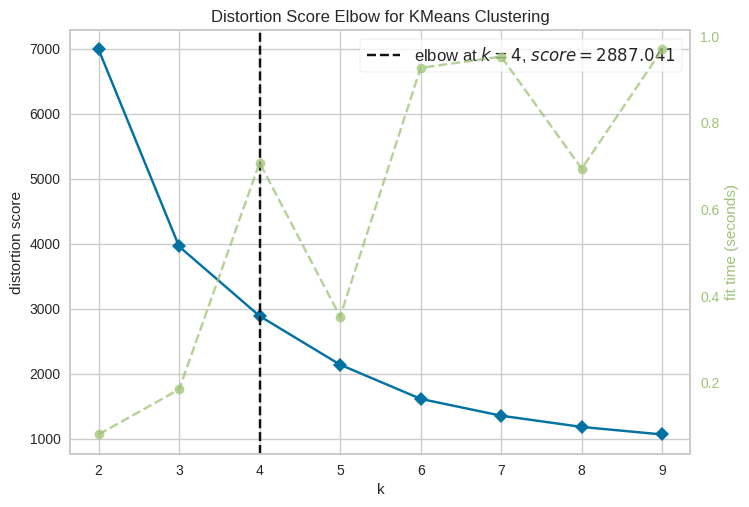

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [298]:
kmeans = KMeans(random_state=42)

# using elbow method to find optimal no of clusters
visualizer = KElbowVisualizer(kmeans, k=(2, 10))
visualizer.fit(cluster_data_scaled)
visualizer.show()

We utilized the elbow method to identify the optimal number of clusters for our K-Means clustering analysis. The elbow method is a technique that involves fitting the K-Means algorithm for a range of clusters (K) and plotting the within-cluster sum of squares (inertia) against the number of clusters. The optimal number of clusters is typically found at the "elbow" point where the rate of decrease in inertia starts to slow down.


In [299]:
optimal_k = 4
kmeans_model = KMeans(n_clusters=optimal_k, random_state=42)
cluster_data['cluster'] = kmeans_model.fit_predict(cluster_data_scaled)


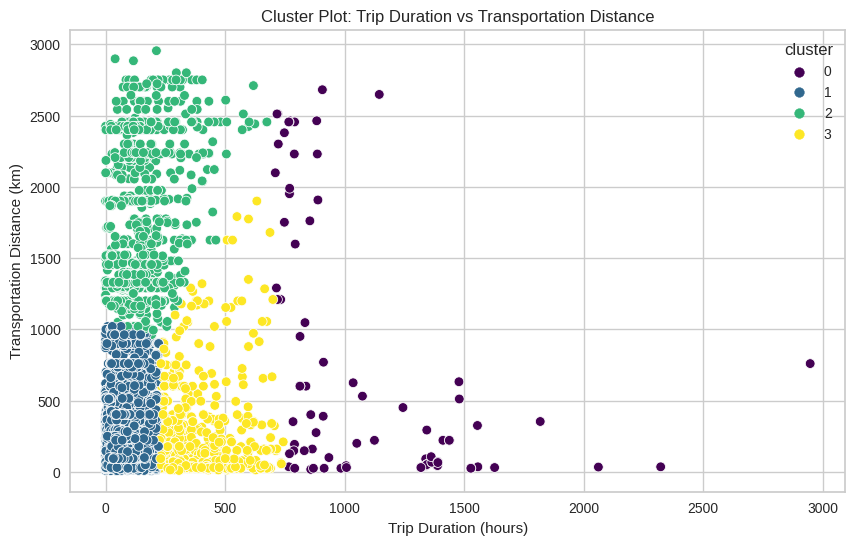

In [300]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='trip_duration_hours', y='TRANSPORTATION_DISTANCE_IN_KM', hue='cluster', data=cluster_data, palette='viridis')
plt.title('Cluster Plot: Trip Duration vs Transportation Distance')
plt.xlabel('Trip Duration (hours)')
plt.ylabel('Transportation Distance (km)')
plt.show()

- By visualizing the clustering results into four distinct groups based on trip duration (hours) and transportation distance (km), we observe patterns that suggest potential insights into driver behavior and performance. It's important to note that, although the clusters provide valuable information, there might be some errors or anomalies in the data that could influence the grouping
- Group 1 appears to consist of drivers with shorter trip durations and lower transportation distances, possibly indicating local or regional routes
- Group 3 demonstrates longer trip durations coupled with moderate distances, suggesting drivers involved in more time-consuming journeys
- Group 2 exhibits relatively short trip durations but covers extensive distances, potentially reflecting high-speed transportation or express deliveries
- Group 4, characterized by both extended trip durations and substantial distances, may include long-haul drivers engaged in extended routes.

These distinctions offer the company valuable insights into diverse driving patterns among its workforce
- Route Strategies:
Focus on optimizing routes for quick turnarounds between short-distance deliveries.
Consider grouping nearby deliveries to minimize travel time.
- Scheduling Efficiency:
Optimize schedules based on cluster characteristics. Ensure that long-haul drivers have adequate rest intervals, and short-distance drivers have optimized turnaround times.
- Equipment and Training:
Tailor equipment and training programs based on the needs of each cluster. Long-haul drivers may require different resources and training compared to those focused on local deliveries.
- Cost Optimization:
Analyze the operational costs associated with each cluster. This could involve fuel costs, maintenance, and other expenses. Adjust strategies to minimize costs and improve overall efficiency.

## Part 5: Database SQL

Given a table of trips and a table of users, write a query to extract the earliest date that each user traveled using their third unique mode.

Note: If a user has traveled less than three unique modes, display their name but with a NULL date and mode name

Example:

Input:
Trips table

| Columns   |   Type   |
| -------   |--------- |
| trip_id   | INTEGER  |
| user_id   | INTEGER  |
| mode      |  TEXT    |
|started_at | DATETIME |
|ended_at| DATETIME|

users table

|Columns|Type|
| -------   |--------- |
|id|INTEGER|
|name|VARCHAR|

Output:

|Columns|Type|
| -------   |--------- |
|name|VARCHAR|
|date|DATETIME|
|mode|TEXT|



## Write your SQL Query Here



```
WITH RankedModes AS (
    SELECT
        user_id,
        CAST(mode AS VARCHAR(100)) AS mode,
        started_at,
        ROW_NUMBER() OVER (PARTITION BY user_id ORDER BY CAST(mode AS VARCHAR(100))) AS mode_rank
    FROM
        Trips
),
UniqueModes AS (
    SELECT
        user_id,
        COUNT(DISTINCT CAST(mode AS VARCHAR(100))) AS unique_modes
    FROM Trips
    GROUP BY user_id
)
SELECT
    R.user_id,
    CASE
        WHEN U.unique_modes >= 3 THEN R.mode
        ELSE NULL
    END AS third_unique_mode,
    CASE
        WHEN U.unique_modes >= 3 THEN R.started_at
        ELSE NULL
    END AS travel_date
FROM RankedModes R
LEFT JOIN UniqueModes U ON R.user_id = U.user_id
WHERE R.mode_rank = 3
UNION ALL
SELECT
    user_id,
    NULL AS third_unique_mode,
    NULL AS travel_date
FROM UniqueModes
WHERE unique_modes < 3;


```



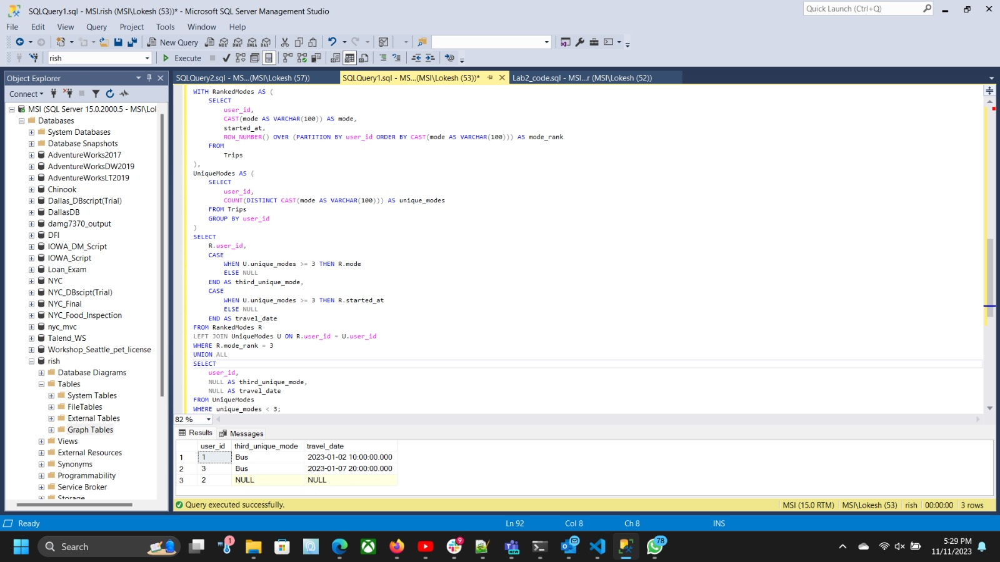